# Линейные методы машинного обучения

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from tqdm import tqdm
from sklearn.base import BaseEstimator, ClassifierMixin
import copy
import math
from tqdm import tqdm
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.linear_model import SGDClassifier
import copy
from sklearn.datasets import make_blobs
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsOneClassifier
from matplotlib.colors import ListedColormap
from matplotlib.colors import ListedColormap
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn import datasets
from  sklearn.svm import SVC
from matplotlib.lines import Line2D
from matplotlib.colors import ListedColormap
import warnings
from sklearn.datasets import make_classification

%matplotlib inline

$ $

Сгенерируем выборку из 1000 точек с 20 признаками на которой будем проводить эксперименты.

$ $

In [2]:
n_examples, n_features = 1000, 20
X, y = make_classification(n_examples, n_features)
y = y * 2 - 1

$ $

Реализуем градиентный спуск и протестируем его для случая логистической регрессии на ранее сгенерированной выборке. Для сравнения качества разных подходов используем значение оптимизируемого функционала.

1) Рассмотрим как влияет размер шага на сходимость.
2) Рассмотрим регуляризованную модель, а также модель без регуляризатора. Сравним, влияет ли наличие регуляризации на скорость сходимости и качество.
3) Исследуем качество оптимизируемого функционала в зависимости от номера итерации.
4) Исследуем, влияет ли выбор начальной инициализации весов на скорость и качество?


$ $

In [53]:
grad_step = [0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.15, 0.2]
regularization_const = [0., 0.0001, 0.001, 0.01, 0.1, 1., 2., 4., 8., 12., 16., 20., 24., 28., 32., 36., 40., 100.]
w = [np.zeros(n_features), np.random.sample(n_features)]

In [3]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

def weighted_samples(X, w):
    return np.dot(X, w)

def error(X, y, w):
    inner_product = np.dot(X, w)
    h = sigmoid(inner_product)
    first_arr = y * np.log(h)
    second_arr = (1 - y) * np.log(1 - h)
    return -(1 / len(y)) * np.sum(first_arr + second_arr)

def Q(X, y, w):
    inner_product = np.dot(X, w)
    exp = np.exp(- inner_product *  y)
    return 1 / len(y) * np.sum(np.log(1 + exp))# + C / 2 * np.linalg.norm(w)

def loss(X, y, w, C):
    w_samples = weighted_samples(X, w)
    return 1 / len(y) * np.sum(- y * np.log(w_samples) - (1. - y) * np.log(1. - w_samples))# + C / 2 * np.linalg.norm(w)

def gradient(X, y, w, C):
    w_samples = weighted_samples(X, w)
    return np.dot(X.T, (w_samples - y)) / len(y) - C * w_old

In [55]:
n_iterations = 10000
speeds = []
qualities = []
losses = []
for C in tqdm(regularization_const):
    speed = 0
    quality = 0
    w_old = copy.deepcopy(w[0])
    w_new = copy.deepcopy(w_old)
    step = grad_step[0]
    for i in range(n_iterations):
        inner_product = np.dot(X, w_old)
        exp = np.exp(- inner_product * y)
        w_new = w_old - step * C * w_old + (step / len(y)) * np.sum(X.T * y * (1 - 1 / (1 + exp)), axis=1)
        for item in w_new:
            if math.isnan(item):
                break
        if np.linalg.norm(w_old - w_new) < 1e-4:
            break
        w_old = copy.deepcopy(w_new)
        speed += 1
    quality = Q(X, y, w_old)
    curr_loss = loss(X, y, w_old, C)
    losses.append(curr_loss)
    speeds.append(speed)
    qualities.append(quality)

  0%|                                                                         | 0/18 [00:00<?, ?it/s]/var/folders/s2/kb7pf5l935d4q34x1y8jk_d00000gn/T/ipykernel_47114/3541064599.py:21: RuntimeWarning: invalid value encountered in log
  return 1 / len(y) * np.sum(- y * np.log(w_samples) - (1. - y) * np.log(1. - w_samples))# + C / 2 * np.linalg.norm(w)
100%|████████████████████████████████████████████████████████████████| 18/18 [00:08<00:00,  2.07it/s]


In [15]:
fontsize = 12
figsize = (16, 4)

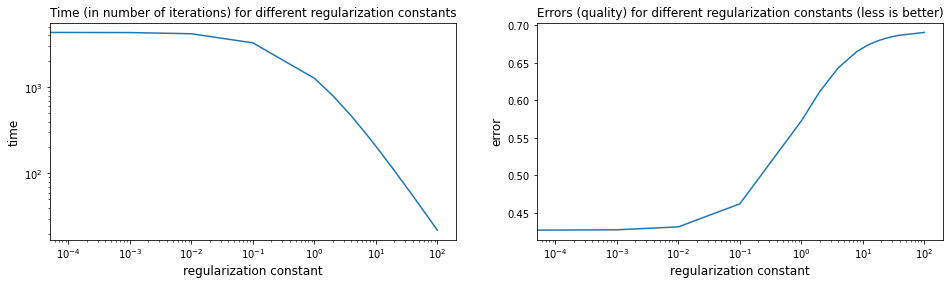

In [56]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=figsize)

ax0.plot(regularization_const, speeds)
ax1.plot(regularization_const, qualities)

ax0.set_title('Time (in number of iterations) for different regularization constants').set_size(fontsize)
ax1.set_title('Errors (quality) for different regularization constants (less is better)').set_size(fontsize)

ax0.set_xticks(regularization_const, fontsize=fontsize)
ax0.set_yticks(speeds, fontsize=fontsize)

ax0.set_xscale('log')
ax1.set_xscale('log')

ax0.set_yscale('log')

ax0.set_xlabel('regularization constant', fontsize=fontsize)
ax1.set_xlabel('regularization constant', fontsize=fontsize)

ax0.set_ylabel('time').set_size(fontsize)
ax1.set_ylabel('error').set_size(fontsize)
plt.show()

$ $

Из графиков видно, что с ростом константы регуляризации увеличивается скорость сходимости, но падает качество алгоритма

$ $

In [57]:
speeds = []
qualities = []
for step in tqdm(grad_step):
    speed = 0
    quality = 0
    w_old = w[0]
    C = 0.01
    for i in range(n_iterations):
        inner_product = np.dot(X, w_old)
        exp = np.exp(- inner_product * y)
        w_new = w_old - step * C * w_old + (step / len(y)) * np.sum(X.T * y * (1 - 1 / (1 + exp)), axis=1)
        if np.linalg.norm(w_old - w_new) < 1e-4:
            break
        w_old = w_new
        speed += 1
    quality = Q(X, y, w_old)
    speeds.append(speed)
    qualities.append(quality)

100%|██████████████████████████████████████████████████████████████████| 8/8 [00:06<00:00,  1.25it/s]


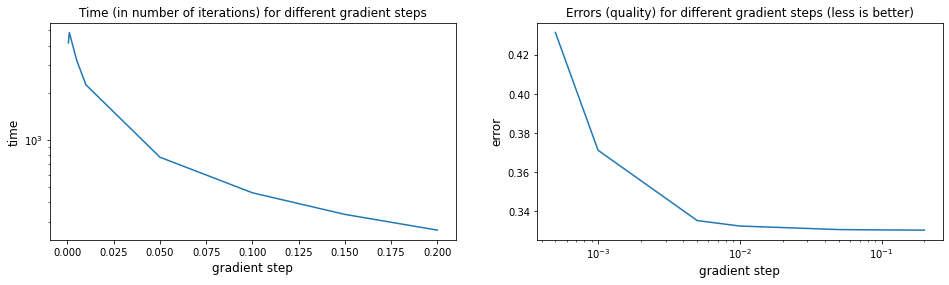

In [58]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=figsize)

ax0.plot(grad_step, speeds)
ax1.plot(grad_step, qualities)

ax0.set_title('Time (in number of iterations) for different gradient steps').set_size(fontsize)
ax1.set_title('Errors (quality) for different gradient steps (less is better)').set_size(fontsize)

ax1.set_xscale('log')

ax0.set_yscale('log')

ax0.set_xlabel('gradient step', fontsize=fontsize)
ax1.set_xlabel('gradient step', fontsize=fontsize)

ax0.set_ylabel('time').set_size(fontsize)
ax1.set_ylabel('error').set_size(fontsize)
plt.show()

$ $

Из графиков видно, что с ростом шага (learning rate) увеличивается скорость сходимости и растет качество алгоритма

$ $

In [59]:
speeds = []
qualities = []
for w_old in tqdm(w):
    speed = 0
    quality = 0
    step = 0.2
    C = 0.01
    for i in range(n_iterations):
        inner_product = np.dot(X, w_old)
        exp = np.exp(- inner_product * y) 
        w_new = w_old - step * C * w_old + (step / len(y)) * np.sum(X.T * y * (1 - 1 / (1 + exp)), axis=1)
        if np.linalg.norm(w_old - w_new) < 1e-4:
            break
        w_old = w_new
        speed += 1
    quality = Q(X, y, w_old)
    speeds.append(speed)
    qualities.append(quality)

100%|██████████████████████████████████████████████████████████████████| 2/2 [00:01<00:00,  1.76it/s]


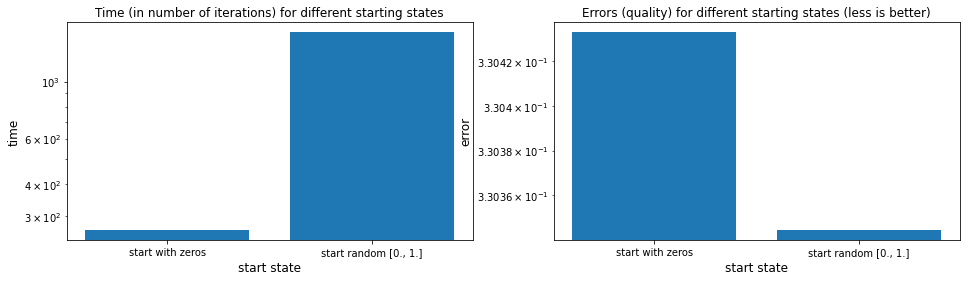

In [60]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=figsize)

xs = ['start with zeros', 'start random [0., 1.]']

ax0.bar(xs, speeds, log=True)
ax1.bar(xs, qualities, log=True)

ax0.set_title('Time (in number of iterations) for different starting states').set_size(fontsize)
ax1.set_title('Errors (quality) for different starting states (less is better)').set_size(fontsize)

ax0.set_xlabel('start state', fontsize=fontsize)
ax1.set_xlabel('start state', fontsize=fontsize)

ax0.set_ylabel('time').set_size(fontsize)
ax1.set_ylabel('error').set_size(fontsize)
plt.show()

$ $

Из графиков видно, что скорость сходимости выше для нулевой начальной инициализации весов, и качество не сильно, но немного лучше у такой инициализации.

$ $

In [61]:
speeds = []
qualities = []
quality = 0
step = 0.2
w_old = w[0]
C = 0.0001
for i in range(n_iterations):
    inner_product = np.dot(X, w_old)
    exp = np.exp(- inner_product * y)
    w_new = w_old - step * C * w_old + (step / len(y)) * np.sum(X.T * y * (1 - 1 / (1 + exp)), axis=1)
    if np.linalg.norm(w_old - w_new) < 1e-4:
        break
    w_old = w_new
    quality = Q(X, y, w_old)
    qualities.append(quality)

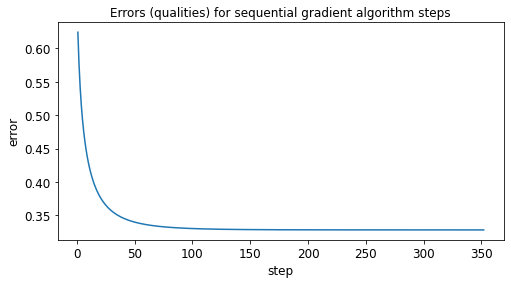

In [62]:
plt.figure(figsize=(8, 4))
plt.plot((range(1, len(qualities) + 1)), qualities)
plt.title('Errors (qualities) for sequential gradient algorithm steps').set_size(fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('step', fontsize=fontsize)
plt.ylabel('error').set_size(fontsize)

$ $

Из графика видно, что по ходу алгоритма (при последовательных итерациях алгоритма) ошибка падает и качество растет

$ $

Реализуем метод стохастического градиентного спуска (SGD).

$ $

In [4]:
class MySgd(BaseEstimator, ClassifierMixin):
    def __init__(self, learning_rate=0.1, alpha=0.0001, tol=.000002):
        self.learning_rate_ = learning_rate
        self.alpha_ = alpha
        self.tol_ = tol
        self.n_iter_ = 0
        self.errors_ = []

    def _quality(self, X, y):
        return Q(X, y, self.w_)

    def _grad_step(self, X, y):
        C = self.alpha_
        step = self.learning_rate_
        idx = np.random.randint(len(X), size=1)
        X_small, y_small = X[idx,:], y[idx]
        inner_product = np.dot(X_small, self.w_)
        exp = np.exp(- inner_product * y_small)
        self.w_ += (- step * C * self.w_ + (step / len(y_small)) * 
                    np.sum(X_small.T * y_small * (1 - 1 / (1 + exp)), axis=1))

    def fit(self, X, y):
        self.w_ = np.zeros(X.shape[1]) #np.random.sample(X.shape[1])
        self.norms_ = []
        self.n_iter_ = 0
        for it in range(10000):
            self.n_iter_ += 1 
            w_old = copy.deepcopy(self.w_)
            self._grad_step(X, y)
            self.norms_.append(np.linalg.norm(w_old - self.w_))
            self.errors_.append(self.error(X, y))
            if np.linalg.norm(w_old - self.w_) < 1e-4:
                break
        return self

    def error(self, X, y):
        return self._quality(X, y)

In [5]:
class MyGrad(BaseEstimator, ClassifierMixin):
    def __init__(self, learning_rate=0.1, alpha=0.0001, tol=.000002):
        self.learning_rate_ = learning_rate
        self.alpha_ = alpha
        self.tol_ = tol
        self.n_iter_ = 0
        self.errors_ = []
        
    def _quality(self, X, y):
        return Q(X, y, self.w_)
    
    def _grad_step(self, X, y):
        C = self.alpha_
        step = self.learning_rate_
        inner_product = np.dot(X, self.w_)
        exp = np.exp(- inner_product * y)
        self.w_ += (- step * C * self.w_ + (step / len(y)) * np.sum(X.T * y * (1 - 1 / (1 + exp)), axis=1))
        
    def fit(self, X, y):
        self.norms_ = []
        self.errors_ = []
        self.w_ = np.zeros(X.shape[1]) #np.random.sample(X.shape[1])
        self.n_iter_ = 0
        for it in range(10000):
            self.n_iter_ += 1
            w_old = copy.deepcopy(self.w_)
            self._grad_step(X, y)
            self.norms_.append(np.linalg.norm(w_old - self.w_))
            self.errors_.append(self.error(X, y))
            if np.linalg.norm(w_old - self.w_) < 1e-4:
                break
        return self
    
    def error(self, X, y):
        return self._quality(X, y)

In [69]:
learning_rates = [0.000001, 0.000005, 0.00001, 0.00005, 0.0001, 0.0005, 0.001, 0.005, 0.01, 0.05, 0.1, 0.2]
time = []
errors = []
for learning_rate in learning_rates:
    my_sgd_new = MySgd(learning_rate=learning_rate)
    my_sgd_new.fit(X, y)
    time.append(my_sgd_new.n_iter_)
    errors.append(my_sgd_new.error(X, y))

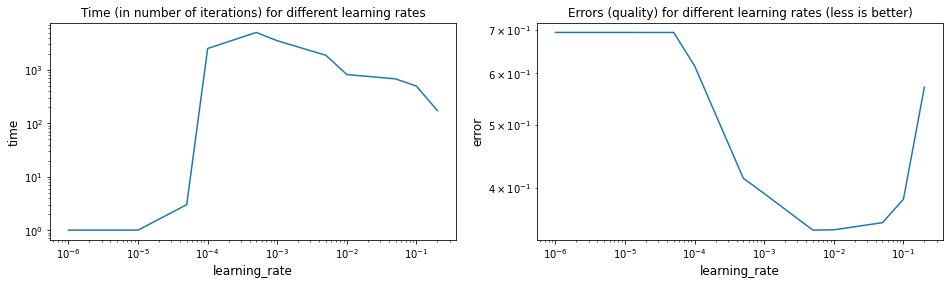

In [70]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=figsize)

ax0.plot(learning_rates, time)
ax1.plot(learning_rates, errors)

ax0.set_title('Time (in number of iterations) for different learning rates').set_size(fontsize)
ax1.set_title('Errors (quality) for different learning rates (less is better)').set_size(fontsize)

ax0.set_xscale('log')
ax1.set_xscale('log')

ax0.set_yscale('log')
ax1.set_yscale('log')

ax0.set_xlabel('learning_rate', fontsize=fontsize)
ax1.set_xlabel('learning_rate', fontsize=fontsize)

ax0.set_ylabel('time').set_size(fontsize)
ax1.set_ylabel('error').set_size(fontsize)
plt.show()

$ $

Из графиков видно, что оптимальное значение скорости обучения равно, примерно, 0.1. Однако, если требуется минимизировать скорость сходимости, то надо выбирать меньшую скорость, но тогда качество будет достаточно низким.

$ $

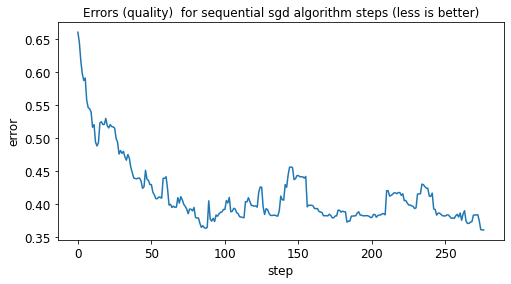

In [71]:
my_sgd = MySgd()
my_sgd.fit(X, y)

plt.figure(figsize=(8, 4))
plt.plot(list(range(len(my_sgd.errors_))), my_sgd.errors_)
plt.title('Errors (quality)  for sequential sgd algorithm steps (less is better)').set_size(fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.xlabel('step', fontsize=fontsize)
plt.ylabel('error').set_size(fontsize)

$ $

Из графика видно, что качество алгоритма, в среднем, растет с номером итерации (ошибка падает). Редкие скачки вверх обусловлены тем, что в sgd объект обучения выбирается случайным образом и попадание в "плохой" (зашумленный) объект может вести к локально неправильному направлению градиента.

$ $

In [19]:
my_grad = MyGrad()
my_grad.fit(X, y)
print('MeGrad finished')

MeGrad finished


In [20]:
sk_sgd = SGDClassifier(tol=.000002, learning_rate='constant', eta0=0.1, loss='log', penalty='l2')
sk_sgd.fit(X, y)

SGDClassifier(eta0=0.1, learning_rate='constant', loss='log', tol=2e-06)

In [21]:
print('ScikitLearn sgd n_iter =', sk_sgd.n_iter_, 'my_grad n_iter =', my_grad.n_iter_, 'my_sgd n_iter =', my_sgd.n_iter_)

ScikitLearn sgd n_iter = 13 my_grad n_iter = 2265 my_sgd n_iter = 220


In [22]:
print('ScikitLearn sgd error =', Q(X, y, sk_sgd.coef_[0]), 'my_grad error =', my_grad.error(X, y), 'my_sgd error =', my_sgd.error(X, y))

ScikitLearn sgd error = 0.20070802403982926 my_grad error = 0.18242819256843118 my_sgd error = 0.21616703414122765


$ $

Результаты показывают примерно одинаковое качество на sgd из пакета sklearn и на моём sgd, при этом качество на обучном градиентном спуске чуть выше. Это может быть вызвано тем, что всё же sgd оптимизирует скорость сходимости, а не качество, а градиент по всем объектам направлен в более правильном направлении, чем последовательный градиент по одному случайному объекту. Скорость сходимости моего sgd выше, чем скорость обычного градиентного спуска, однако, ниже, чем скорость сходимости градиентного спуска из пакета sklearn. Это может быть вызвано базовым использованием sgd из sklearn различных оптимизаторов как из следующей задачи (Adagrad или иных).

$ $

Добавим в выборку случайный шум.

$ $

In [23]:
len_3percent = int(len(X)*0.03)
chosen_indexes = np.random.choice(list(range(len(X))), len_3percent)
shifting = np.random.normal(0, 3., (len_3percent, np.shape(np.array(X))[1]))
X_new = copy.deepcopy(X)
#print(np.shape(X_new[chosen_indexes]), np.shape(shifting))
X_new[chosen_indexes] += shifting
Y_new = copy.deepcopy(y)
Y_new[chosen_indexes] = -Y_new[chosen_indexes]

In [25]:
my_sgd.fit(X_new, Y_new)
my_grad.fit(X_new, Y_new)
print('Fit finished')

Fit finished


In [26]:
print('my_grad n_iter =', my_grad.n_iter_, 'my_sgd n_iter =', my_sgd.n_iter_)

my_grad n_iter = 3528 my_sgd n_iter = 124


In [27]:
print('my_grad error =', my_grad.error(X, y), 'my_sgd error =', my_sgd.error(X, y))

my_grad error = 0.21738088234702996 my_sgd error = 0.2931335888281945


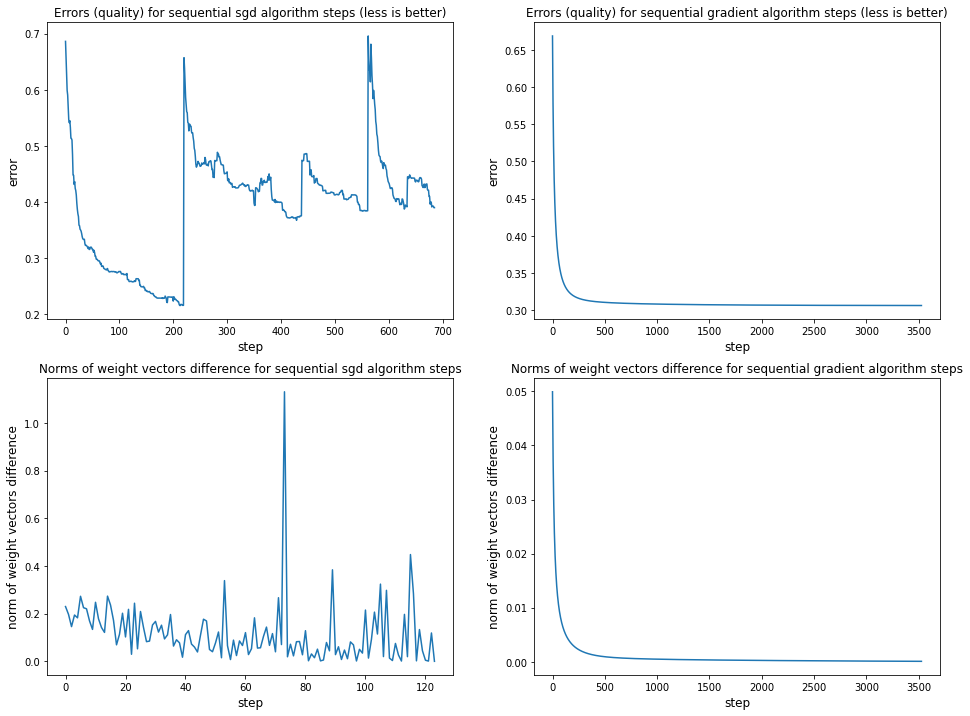

In [35]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, sharex=False, figsize=(16, 12))

ax0.plot(list(range(len(my_sgd.errors_))), my_sgd.errors_)
ax1.plot(list(range(len(my_grad.errors_))), my_grad.errors_)
ax2.plot(list(range(len(my_sgd.norms_))), my_sgd.norms_)
ax3.plot(list(range(len(my_grad.norms_))), my_grad.norms_)

ax0.set_title('Errors (quality) for sequential sgd algorithm steps (less is better)').set_size(fontsize)
ax1.set_title('Errors (quality) for sequential gradient algorithm steps (less is better)').set_size(fontsize)
ax2.set_title('Norms of weight vectors difference for sequential sgd algorithm steps').set_size(fontsize)
ax3.set_title('Norms of weight vectors difference for sequential gradient algorithm steps').set_size(fontsize)

ax0.set_xlabel('step', fontsize=fontsize)
ax1.set_xlabel('step', fontsize=fontsize)
ax2.set_xlabel('step', fontsize=fontsize)
ax3.set_xlabel('step', fontsize=fontsize)

ax0.set_ylabel('error').set_size(fontsize)
ax1.set_ylabel('error').set_size(fontsize)
ax2.set_ylabel('norm of weight vectors difference').set_size(fontsize)
ax3.set_ylabel('norm of weight vectors difference').set_size(fontsize)
plt.show()

$ $

Можем видеть, что скорость сходимости sgd на зашумленных данных всё еще выше скорости обычного градиентного спуска, однако, ошибка гораздо выше. Это вызвано тем, что выбор случайного сильно зашумленного объекта (и тем более нескольких подряд) в sgd сильно меняет направление градиента. При этом на норму разности векторов весов это может не влиять сильно. Что и видно из графиков.

$ $

Реализуем методы оптимизации Momentum и один из Adagrad.
Сравним оба метода с классическим sgd с точки зрения скорости сходимости.
Посмотрим как значение гиперпараметра  𝛾 влияет на скорость сходимости и качество в методе Momentum.

$ $

In [37]:
class MyMomentum(BaseEstimator, ClassifierMixin):
    def __init__(self, learning_rate=0.1, alpha=0.0001, tol=.000002, momentum_term=0.1):
        self.learning_rate_ = learning_rate
        self.alpha_ = alpha
        self.tol_ = tol
        self.n_iter_ = 0
        self.momentum_term_ = momentum_term
        self.nu_ = 0
        
    def _quality(self, X, y):
        return Q(X, y, self.w_)
    
    def _grad_step(self, X, y):
        C = self.alpha_
        step = self.learning_rate_
        idx = np.random.randint(len(X), size=1)
        X_small, y_small = X[idx,:], y[idx]
        inner_product = np.dot(X_small, self.w_)
        exp = np.exp(- inner_product * y_small)
        grad = step * C * self.w_ - (step / len(y_small)) * np.sum(X_small.T * y_small * (1 - 1 / (1 + exp)), axis=1)
        self.nu_ *= self.momentum_term_
        self.nu_ += copy.deepcopy(grad)
        self.w_ -= copy.deepcopy(self.nu_)
    
    def fit(self, X, y):
        self.nu_ = 0
        self.norms_ = []
        self.errors_ = []
        self.w_ = np.zeros(X.shape[1])
        self.n_iter_ = 0
        for it in range(10000):
            self.n_iter_ += 1 
            w_old = copy.deepcopy(self.w_)
            self._grad_step(X, y)
            self.errors_.append(self.error(X, y))
            self.norms_.append(np.linalg.norm(w_old - self.w_))
            if np.linalg.norm(w_old - self.w_) < 1e-4:
                break
        return self
    
    def error(self, X, y):
        return self._quality(X, y)

In [39]:
my_momentum = MyMomentum()
my_momentum.fit(X_new, Y_new)
print('Momentum is finished')

Momentum is finished


In [40]:
my_sgd2 = MySgd()
my_sgd2.fit(X_new, Y_new)
print('SGD is finished')

SGD is finished


In [41]:
print("SGD error = ", my_sgd2.error(X, y))
print("Momentum error = ", my_momentum.error(X, y))

SGD error =  0.281112386007594
Momentum error =  0.2632502162933291


In [42]:
print('my_momentum n_iter =', my_momentum.n_iter_, 'my_sgd n_iter =', my_sgd2.n_iter_)

my_momentum n_iter = 1301 my_sgd n_iter = 128


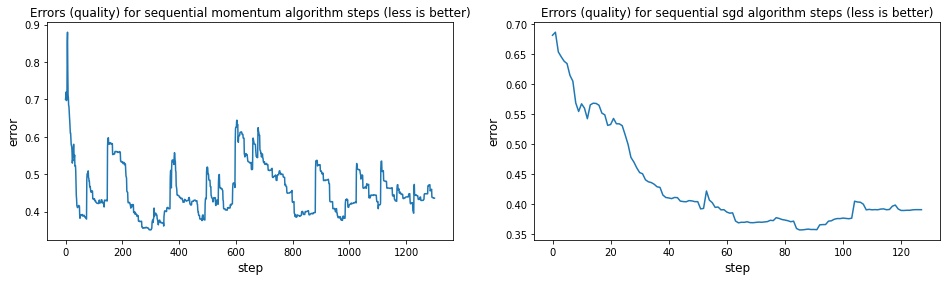

In [43]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=figsize)

ax0.plot(list(range(len(my_momentum.errors_))), my_momentum.errors_)
ax1.plot(list(range(len(my_sgd2.errors_))), my_sgd2.errors_)

ax0.set_title('Errors (quality) for sequential momentum algorithm steps (less is better)').set_size(fontsize)
ax1.set_title('Errors (quality) for sequential sgd algorithm steps (less is better)').set_size(fontsize)

ax0.set_xlabel('step', fontsize=fontsize)
ax1.set_xlabel('step', fontsize=fontsize)

ax0.set_ylabel('error').set_size(fontsize)
ax1.set_ylabel('error').set_size(fontsize)

$ $

Можем видеть, что при значени momentum_term=0.9 результаты практически одинаковые у momentum и у sgd.

$ $

In [46]:
momentum_terms = np.arange(0.0, 0.99, 0.05, dtype=float)

In [47]:
from tqdm import tqdm

time = []
errors = []
for momentum_term in tqdm(momentum_terms):
    my_momentum_new = MyMomentum(momentum_term=momentum_term)
    my_momentum_new.fit(X_new, Y_new)
    time.append(my_momentum_new.n_iter_)
    errors.append(my_momentum_new.error(X_new, Y_new))

 95%|█████████████████████████████████████████████████████▏  | 19/20 [00:35<00:03,  3.01s/it]/var/folders/s2/kb7pf5l935d4q34x1y8jk_d00000gn/T/ipykernel_38053/3541064599.py:16: RuntimeWarning: overflow encountered in exp
  exp = np.exp(- inner_product *  y)
100%|████████████████████████████████████████████████████████| 20/20 [00:38<00:00,  1.90s/it]


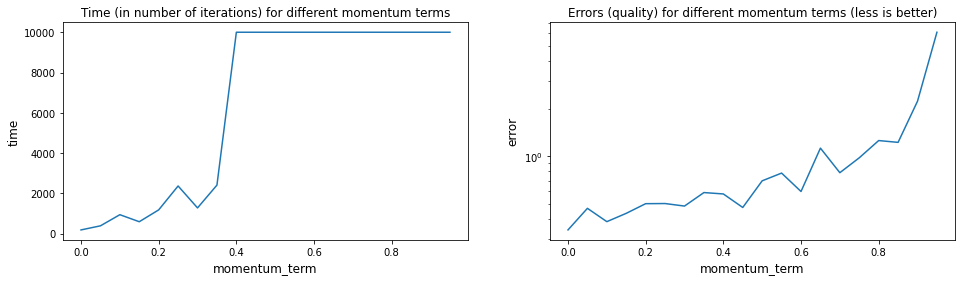

In [48]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=figsize)

ax0.plot(momentum_terms, time)
ax1.plot(momentum_terms, errors)

ax0.set_title('Time (in number of iterations) for different momentum terms').set_size(fontsize)
ax1.set_title('Errors (quality) for different momentum terms (less is better)').set_size(fontsize)

ax0.set_xlabel('momentum_term', fontsize=fontsize)
ax1.set_xlabel('momentum_term', fontsize=fontsize)

ax1.set_yscale('log')

ax0.set_ylabel('time').set_size(fontsize)
ax1.set_ylabel('error').set_size(fontsize)

$ $

Можем видеть, что в среднем чем меньше значение momentum_term, тем меньше ошибка и выше скорость сходимости. Это означает, что выигрыш momentum_term на наших данных может дать только небольшой, при "малой" инерции. Это логично, когда в данных присутствует шум, потому что при большой инерции от "шумного" объекта вектор весов "долго" испытывает влияние.

$ $

In [49]:
class MyAdagrad(BaseEstimator, ClassifierMixin):
    def __init__(self, learning_rate=0.006, alpha=0.0001, tol=.000002):
        self.learning_rate_ = learning_rate
        self.alpha_ = alpha
        self.tol_ = tol
        self.n_iter_ = 0
        self.momentum_term_ = momentum_term
        self.nu_ = 0
        
    def _quality(self, X, y):
        return Q(X, y, self.w_)
    
    def _grad_step(self, X, y):
        idx = np.random.randint(len(X), size=1)
        X_small, y_small = X[idx,:], y[idx]
        C = self.alpha_
        step = self.learning_rate_
        inner_product = np.dot(X_small, self.w_)
        exp = np.exp(- inner_product * y)
        grad = C * self.w_ - (1 / len(y_small)) * np.sum(X_small.T * y_small * (1 - 1 / (1 + exp)), axis=1)
        G_plus_epsilon = copy.deepcopy(self.G_)
        epsilon = 1e-8
        self.G_ += grad ** 2
        G_plus_epsilon += grad ** 2 + epsilon
        self.w_ -= step * ((1 / np.sqrt(G_plus_epsilon)) * grad)

    def fit(self, X, y):
        self.errors_ = []
        self.G_ = np.zeros(X.shape[1])
        ld=len(X)
        self.w_ = np.zeros(X.shape[1])
        self.n_iter_ = 0
        for it in range(10000):
            self.n_iter_ += 1 
            w_old = copy.deepcopy(self.w_)
            self._grad_step(X, y)
            self.errors_.append(self.error(X, y))
            if np.linalg.norm(w_old - self.w_) < 1e-4:
                break
        return self
    
    def error(self, X, y):
        return self._quality(X, y)

In [50]:
my_ada = MyAdagrad()
my_ada.fit(X_new, Y_new)

my_sgd2 = MySgd(learning_rate=0.006)
my_sgd2.fit(X_new, Y_new)

print("SGD error = ", my_sgd2.error(X_new, Y_new))
print("Adagrad  error = ",my_ada.error(X_new, Y_new))
print('Adagrad n_iter =', my_ada.n_iter_, 'SGD n_iter =', my_sgd2.n_iter_)

SGD error =  0.3413246753921396
Adagrad  error =  0.40739421170670875
Adagrad n_iter = 10000 SGD n_iter = 1631


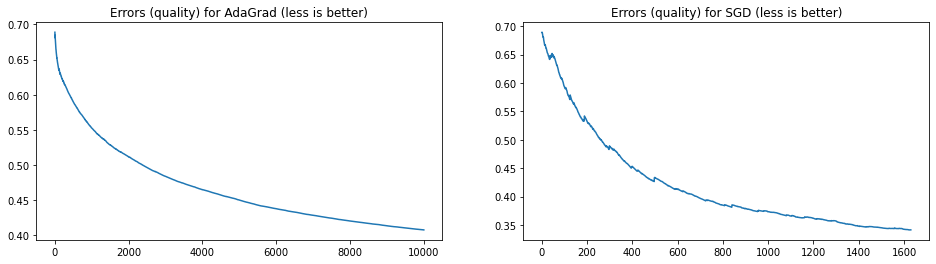

In [51]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=figsize)

ax0.plot(list(range(len(my_ada.errors_))), my_ada.errors_)
ax1.plot(list(range(len(my_sgd2.errors_))), my_sgd2.errors_)

ax0.set_title('Errors (quality) for AdaGrad (less is better)').set_size(fontsize)
ax1.set_title('Errors (quality) for SGD (less is better)').set_size(fontsize)

In [52]:
learning_rates = [0.00001, 0.0001, 0.0002, 0.0005, 0.001, 0.0015, 0.002, 0.003, 0.004, 0.005, 0.01]
alpha = [0.01, 0.05, 0.1, 0.15, 0.2, 0.5, 1., 2., 3., 5.]
time = []
errors = []
for learning_rate in tqdm(learning_rates):
    my_ada_new = MyAdagrad(learning_rate=learning_rate)
    my_ada_new.fit(X_new, Y_new)
    time.append(my_ada_new.n_iter_)
    errors.append(my_ada_new.error(X_new, Y_new))

100%|████████████████████████████████████████████████████████| 11/11 [00:16<00:00,  1.52s/it]


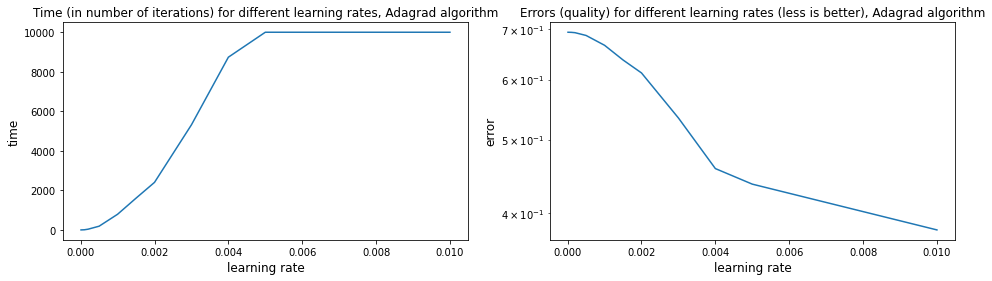

In [53]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, sharex=False, figsize=figsize)

ax0.plot(learning_rates, time)
ax1.plot(learning_rates, errors)

ax0.set_title('Time (in number of iterations) for different learning rates, Adagrad algorithm').set_size(fontsize)
ax1.set_title('Errors (quality) for different learning rates (less is better), Adagrad algorithm').set_size(fontsize)

ax0.set_xlabel('learning rate', fontsize=fontsize)
ax1.set_xlabel('learning rate', fontsize=fontsize)

ax1.set_yscale('log')

ax0.set_ylabel('time').set_size(fontsize)
ax1.set_ylabel('error').set_size(fontsize)

$ $

Можем видеть, что использование адаптивного шага в Adagrad преимущества не дало.

$ $

# Многоклассовая классификация

Сгенерируем несколько выборок точек с 2 признаками и 3 классами (по 100 объектов каждого класса) на которых будем проводить эксперименты.

Обучим логистическую регрессию тремя различными способами:
 - в режиме multinomial, оптимизирующем многоклассовую функцию потерь
 - в режиме OvR
 - в режиме OvO

In [56]:
random_state = 10

n_samples = [100, 100, 100]
n_features = 2
cluster_stds = [1.0, [1.3, 1.3, 1.3], 1.0, [1.7, 1.7, 1.7]]

X, y = [], []
for i in range(4):
    blobs = make_blobs(n_samples=n_samples, n_features=n_features, cluster_std=cluster_stds[i])
    X.append(blobs[0])
    y.append(blobs[1])

In [57]:
MultinomialLR = LogisticRegression(solver='newton-cg', multi_class='multinomial')
OvRLR = LogisticRegression(solver='newton-cg', multi_class='ovr')
LR = LogisticRegression(solver='newton-cg')
OvOLR = OneVsOneClassifier(LR)

In [62]:
MultinomialLR.fit(X[0], y[0])
OvRLR.fit(X[0], y[0])
OvOLR.fit(X[0], y[0])

OneVsOneClassifier(estimator=LogisticRegression(solver='newton-cg'))

In [93]:
def plotting(X3, y3, number):
    def x_y(clf):
        w1 = clf.coef_[0]
        a1 = -w1[0] / w1[1]
        x_min, x_max = X3[:, 0].min() - .5, X3[:, 0].max() + .5
        xx1 = np.linspace(x_min, x_max)
        yy1 = a1 * xx1 - (clf.intercept_[0]) / w1[1]

        w2 = clf.coef_[1]
        a2 = -w2[0] / w2[1]
        xx2 = np.linspace(x_min, x_max)
        yy2 = a2 * xx2 - (clf.intercept_[1]) / w2[1]

        w3 = clf.coef_[2]
        a3 = -w3[0] / w3[1]
        xx3 = np.linspace(x_min, x_max)
        yy3 = a3 * xx3 - (clf.intercept_[2]) / w3[1]

        return (xx1, yy1, xx2, yy2, xx3, yy3)
    MultinomialLR.fit(X3, y3)
    OvRLR.fit(X3, y3)
    OvOLR.fit(X3, y3)
    xx1_MLR, yy1_MLR, xx2_MLR, yy2_MLR, xx3_MLR, yy3_MLR = x_y(MultinomialLR)
    xx1_OvRLR, yy1_OvRLR, xx2_OvRLR, yy2_OvRLR, xx3_OvRLR, yy3_OvRLR = x_y(OvRLR)
    x_min, x_max = X3[:, 0].min() - .5, X3[:, 0].max() + .5
    y_min, y_max = X3[:, 1].min() - .5, X3[:, 1].max() + .5

    w1 = OvOLR.estimators_[0].coef_[0]
    a1 = -w1[0] / w1[1]
    xx1_OvOLR = np.linspace(x_min, x_max)
    yy1_OvOLR = a1 * xx1_OvOLR - (OvOLR.estimators_[0].intercept_) / w1[1]

    w2 = OvOLR.estimators_[1].coef_[0]
    a2 = -w2[0] / w2[1]
    xx2_OvOLR = np.linspace(x_min, x_max)
    yy2_OvOLR = a2 * xx2_OvOLR - (OvOLR.estimators_[1].intercept_) / w2[1]

    w3 = OvOLR.estimators_[2].coef_[0]
    a3 = -w3[0] / w3[1]
    xx3_OvOLR = np.linspace(x_min, x_max)
    yy3_OvOLR = a3 * xx3_OvOLR - (OvOLR.estimators_[2].intercept_) / w3[1]


    colors = ['red','green','blue']
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=(14, 4))
    f.suptitle("Separating surfaces of LogisticRegression, set #" + str(number), fontsize=fontsize)
    x_min, x_max = X3[:, 0].min() - .5, X3[:, 0].max() + .5
    y_min, y_max = X3[:, 1].min() - .5, X3[:, 1].max() + .5
    h = .02
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    Z = MultinomialLR.predict(np.c_[xx.ravel(), yy.ravel()])

    Z = Z.reshape(xx.shape)
    plt.figure(1, figsize=(3,5, 2.5))
    ax1.pcolormesh(xx, yy, Z, cmap=ListedColormap(colors))
    ax1.scatter(X3.T[0], X3.T[1], c=y3, cmap=ListedColormap(colors), edgecolors='k')
    ax1.set_title("multinomial")

    
    Z = OvRLR.predict(np.c_[xx.ravel(), yy.ravel()])

    Z = Z.reshape(xx.shape)
    plt.figure(1, figsize=(3.5, 2.5))
    ax2.pcolormesh(xx, yy, Z, cmap=ListedColormap(colors))
    ax2.scatter(X3.T[0], X3.T[1], c=y3, cmap=ListedColormap(colors), edgecolors='k')
    ax2.set_title("OvR")
    
    Z = OvOLR.predict(np.c_[xx.ravel(), yy.ravel()])

    Z = Z.reshape(xx.shape)
    plt.figure(1, figsize=(3.5, 2.5))
    ax3.pcolormesh(xx, yy, Z, cmap=ListedColormap(colors))
    ax3.scatter(X3.T[0], X3.T[1], c=y3, cmap=ListedColormap(colors), edgecolors='k')
    ax3.set_title("OvO")

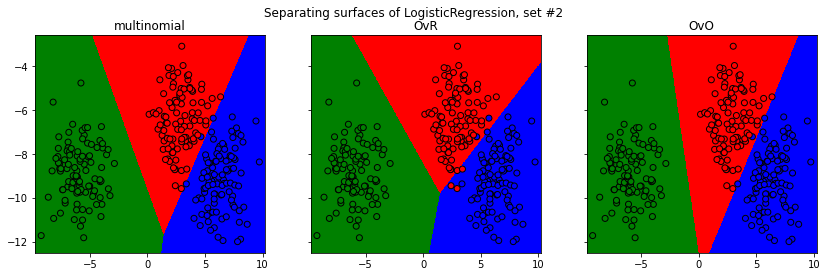

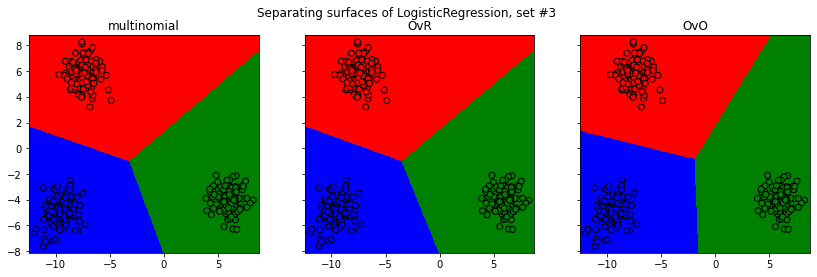

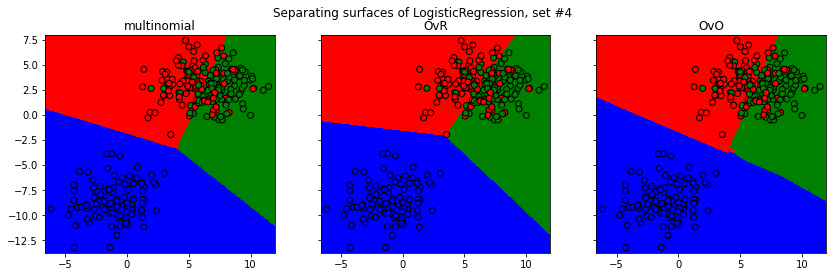

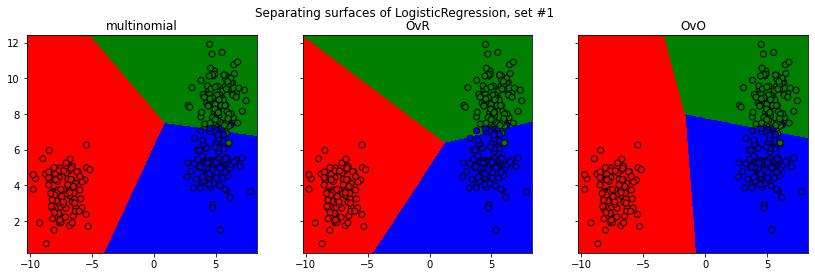

In [94]:
plotting(X[0], y[0], 1)
plotting(X[1], y[1], 2)
plotting(X[2], y[2], 3)
plotting(X[3], y[3], 4)

Можем видеть, что в целом все три стратегии показывают хорошие результаты. Однако, на плохо разделимой выборке (set#4) результаты OvR хуже. На этой же выборке наблюдается небольшое переобучение стратегии OvO при построении разделяющей проверхности. Стратегия OvO асимптотически (с ростом числа классов) очень вычислительно затратна, однако, на маленьком количестве классов и на больших выборках даёт более точные результаты, чем OvR. На маленьких выборках OvO может вести к переобучению. Multinomial также может быть достаточно вычислительно затратной, но даёт достаточно хорошее качество. В частности, Multinomial даёт лучшие результаты, если объекты по классам распределены не равномерно.

## Линейная регрессия

Сгенерируем выборку из 600 точек с двумя признаками для задачи регрессии

In [115]:
from sklearn.datasets import make_regression

In [116]:
X, y = make_regression(n_samples=600, n_features=2)

Точное решение:

In [117]:
C = 0.001
w_classic = np.dot(np.linalg.inv(np.dot(X.T, X)), np.dot(X.T, y))
w_with_normalization = np.dot(np.linalg.inv(np.dot(X.T, X) + C * np.eye(X.shape[1], dtype=float)), np.dot(X.T, y))

Точное решение задачи линейной регресии требует нахождения обратной матрицы, а также несколько матричных перемножений, что вычислительно затратно. Применим метод стохастического градиентного спуска.

In [118]:
class MyLinearSgd(BaseEstimator, ClassifierMixin):
    def __init__(self, learning_rate=0.1, alpha=0.0001, tol=.000002):
        self.learning_rate_ = learning_rate
        self.alpha_ = alpha
        self.tol_ = tol
        self.n_iter_ = 0
        self.errors_ = []

    def _quality(self, X, y):
        return 1. / len(y) * np.sum((np.dot(X, self.w_) - y) ** 2)

    def _grad_step(self, X, y):
        C = self.alpha_
        step = self.learning_rate_
        idx = np.random.randint(len(X), size=1)
        X_small, y_small = X[idx,:], y[idx]
        grad = (X_small.T).dot(np.dot(X_small, self.w_) - y_small)
        self.w_ -= step * grad

    def fit(self, X, y):
        self.w_ = np.random.sample(X.shape[1]) #np.random.sample(X.shape[1])
        self.norms_ = []
        self.n_iter_ = 0
        for it in range(10000):
            self.n_iter_ += 1 
            w_old = copy.deepcopy(self.w_)
            self._grad_step(X, y)
            self.norms_.append(np.linalg.norm(w_old - self.w_))
            self.errors_.append(self.error(X, y))
            if np.linalg.norm(w_old - self.w_) < 1e-4:
                break
        return self

    def error(self, X, y):
        return self._quality(X, y)

In [119]:
my_sgd = MyLinearSgd(learning_rate=0.01, alpha=C)
my_sgd.fit(X, y)
print("Norm of weight vectors difference with regularization constant:", 
      np.linalg.norm(w_with_normalization - my_sgd.w_))

Norm of weight vectors difference with regularization constant: 45.54776744480085


In [120]:
my_sgd = MyLinearSgd(learning_rate=0.01, alpha=0.)
my_sgd.fit(X, y)
print("Norm of weight vectors difference without regularization constant:", 
      np.linalg.norm(w_classic- my_sgd.w_))

Norm of weight vectors difference without regularization constant: 2.9515416357615494


In [121]:
print("SGD error:", my_sgd.error(X, y))

SGD error: 8.171901035125755


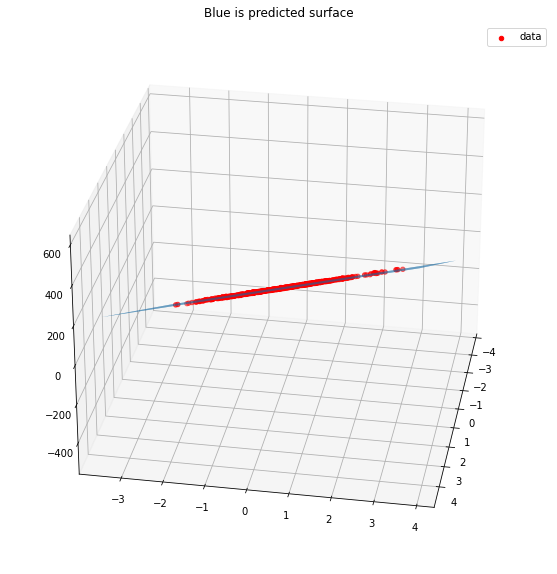

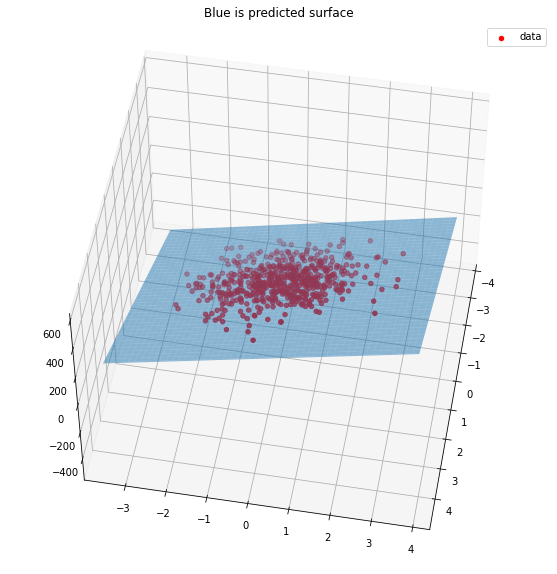

In [127]:
from mpl_toolkits.mplot3d import Axes3D 
import matplotlib.pyplot as plt

x1 = np.arange(X[:, 0].min() - 1., X[:, 0].max() + 1., 0.05)
y1 = np.arange(X[:, 1].min() - 1., X[:, 1].max() + 1., 0.05)
X_plot, Y_plot = np.meshgrid(x1, y1)
xy = np.vstack([X_plot.ravel(), Y_plot.ravel()]).T
Z = np.dot(xy, my_sgd.w_).reshape(X_plot.shape)

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X_plot, Y_plot, Z)
ax.scatter(X[:, 0], X[:, 1], y, c='red', label="data")
ax.view_init(elev=28, azim=10)
ax.set_title("Blue is predicted surface")
ax.legend()

fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X_plot, Y_plot, Z, alpha=0.5)
ax.scatter(X[:, 0], X[:, 1], y, c='red', label="data")
ax.view_init(elev=50, azim=10)
ax.set_title("Blue is predicted surface")
ax.legend()

Различия в векторах весов существенные, однако и ошибка у SGD ненулевая. Тем не менее, по графикам выше можно понять, что полученная поверхность неплохо приближает данные.


Теперь пусть исходная зависимость имеет вид  𝑦=𝑥⋅𝑠𝑖𝑛(𝑥). Сгенерируем соответствующие точки:

In [128]:
from sklearn.model_selection import train_test_split

In [129]:
X = np.linspace(0, 10, 100)
y = X * np.sin(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

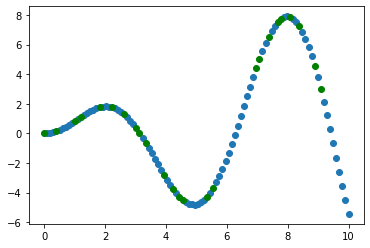

In [131]:
plt.scatter(X_train, y_train)
plt.scatter(X_test, y_test, c='g')

Применим модель линейной регрессии

In [132]:
from sklearn.linear_model import LinearRegression

In [133]:
lr = LinearRegression()
lr.fit(X_train[:, np.newaxis], y_train)

LinearRegression()

In [134]:
y_plot = lr.predict(X[:, np.newaxis])

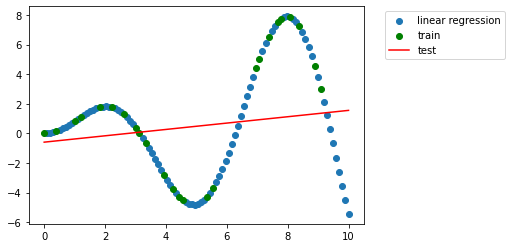

In [135]:
plt.scatter(X_train, y_train)
plt.scatter(X_test, y_test, c='g')
plt.plot(X, y_plot, c='r')
plt.legend(('linear regression', 'train', 'test'), bbox_to_anchor=(1.05, 1), loc=2)

In [136]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test, lr.predict(X_test[:, np.newaxis])) 

14.759977502823235

Воспользуемся классом PolynomialFeatures и добавьте к данным зависимости  𝑦=𝑥⋅𝑠𝑖𝑛(𝑥). различные полиномы.

AxesSubplot(0.327174,0.593621;0.168478x0.130172)


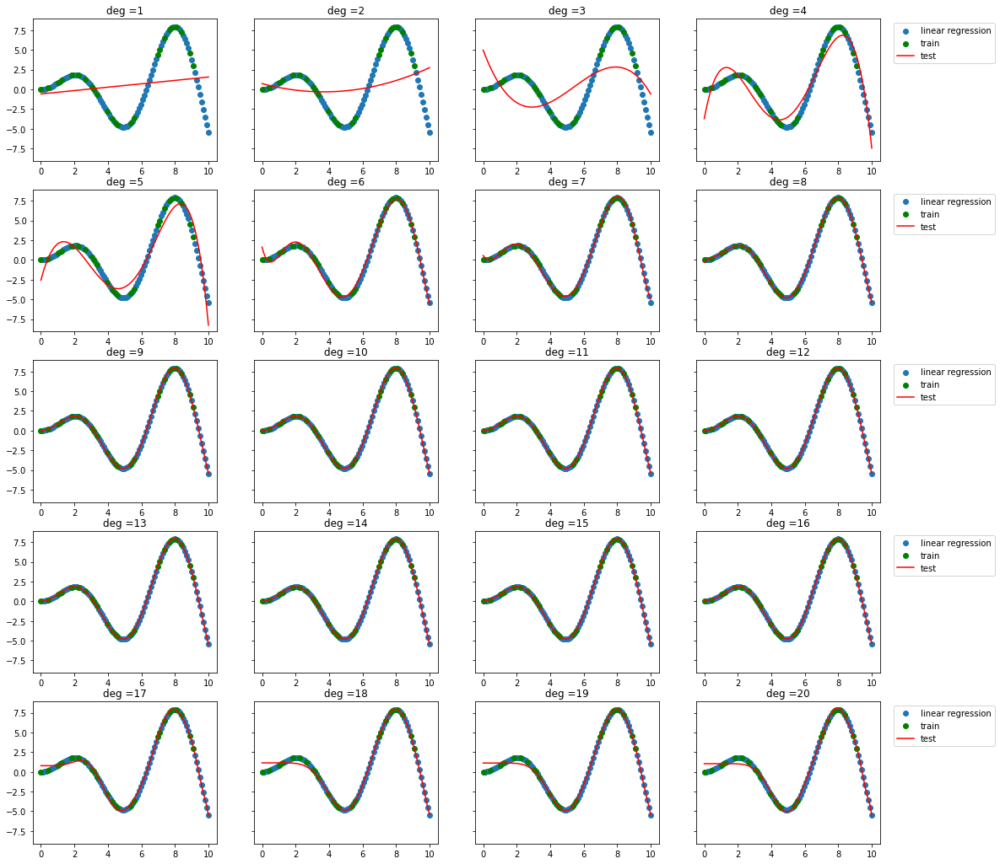

In [139]:
f, ax = plt.subplots(5, 4, sharey=True, figsize=(18, 18))
print(ax[int(5/4)][5%4])
for i in range(1, 21):
    poly = PolynomialFeatures(i)
    X_copy = copy.deepcopy(X[:, np.newaxis])
    X_train, X_test, y_train, y_test = train_test_split(X_copy, y, random_state=42)
    X_train_new = poly.fit_transform(X_train)
    X_test_new = poly.fit_transform(X_test)
    lr = LinearRegression()
    lr.fit(X_train_new , y_train)
    #print(X_train[0])
    ax[int((i-1)/4)][(i-1)%4].scatter(X_train, y_train)
    ax[int((i-1)/4)][(i-1)%4].scatter(X_test, y_test, c='g')
    y_plot = lr.predict(poly.fit_transform(X[:, np.newaxis]))
    ax[int((i-1)/4)][(i-1)%4].plot(X, y_plot, c='r')
    if ((i) % 4 == 0):
        ax[int((i-1)/4)][(i-1)%4].legend(('linear regression', 'train', 'test'), bbox_to_anchor=(1.05, 1), loc=2)
    ax[int((i-1)/4)][(i-1)%4].set_title("deg =" + str(i))
plt.show()

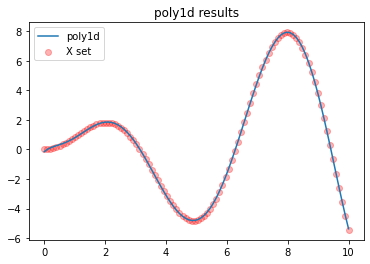

In [140]:
p = np.poly1d(np.polyfit(X, y, deg=8))
plt.plot(X, p(X), label='poly1d')
plt.scatter(X, y, c='red', alpha=0.3, label='X set')
plt.title("poly1d results")
plt.legend()
plt.show()

Из графиков видно, что степени полинома примерно с 8 по 15 являются оптимальными, при меньших степенях полинома наблюдается недообучение, при больших - переобучение. Однако, такой подход в любом случае подгоняет функцию под некоторый полином, что будет давать большие ошибки вне "отрезка" тренировочных данных. Функция numpy.poly1d даёт схожие результаты, однако, обладает теми же проблемами.

## Линейный SVM

Сгенерируем три случайные двумерные выборки для бинарной классификации:
- с линейно-разделимыми классами
- с хорошо разделимыми классами, но не линейно
- с плохо разделимыми классами по имеющимся признакам

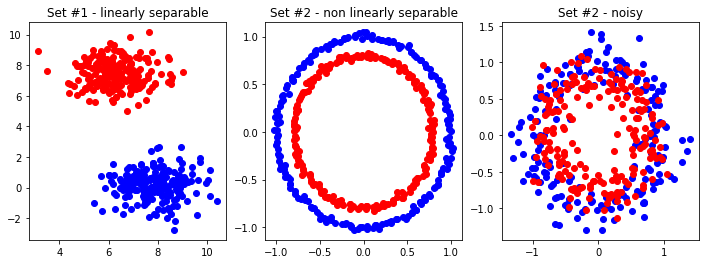

In [143]:
X_separable, y_separable = datasets.make_blobs(n_samples=400, centers=2, n_features=2, center_box=(0, 10), random_state=10)
f, ax = plt.subplots(1, 3, sharey=False, figsize=(12, 4), sharex=False)#, sharey=False)
ax[0].plot(X_separable[:, 0][y_separable == 0], X_separable[:, 1][y_separable == 0], 'bo')
ax[0].plot(X_separable[:, 0][y_separable == 1], X_separable[:, 1][y_separable == 1], 'ro')
ax[0].set_title("Set #1 - linearly separable")

X_circles, y_circles = datasets.make_circles(n_samples=400, noise=0.02, random_state=10)
ax[1].plot(X_circles[:, 0][y_circles== 0], X_circles[:, 1][y_circles == 0], 'bo')
ax[1].plot(X_circles[:, 0][y_circles == 1], X_circles[:, 1][y_circles == 1], 'ro')
ax[1].set_title("Set #2 - non linearly separable")

X_random, y_random = datasets.make_circles(n_samples=400, noise=0.18, random_state=10)
ax[2].plot(X_random[:, 0][y_random== 0], X_random[:, 1][y_random == 0], 'bo')
ax[2].plot(X_random[:, 0][y_random == 1], X_random[:, 1][y_random == 1], 'ro')
ax[2].set_title("Set #2 - noisy")
plt.show()

Протестируем линейный SVM на сгенерированных выборках.

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

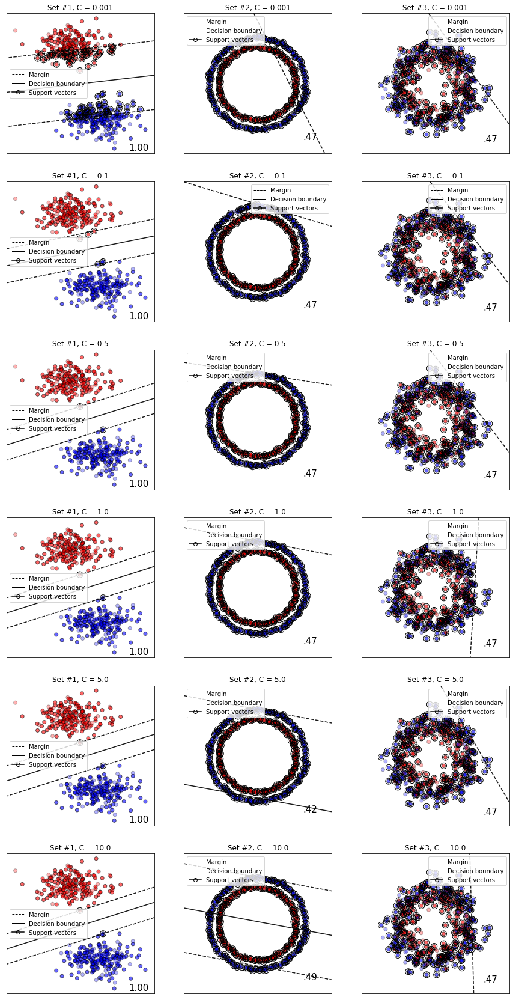

In [165]:
from tqdm import tqdm_notebook as tqdm
warnings.simplefilter("ignore")

datas = [(X_separable, y_separable),
            (X_circles, y_circles),
            (X_random, y_random)]

Cs = [0.001, 0.1, 0.5, 1., 5., 10.]
f, ax = plt.subplots(len(Cs), len(datas), sharey=False, figsize=(15, 30), sharex=False)
for C_cnt, C in tqdm(enumerate(Cs)):
    for ds_cnt, ds in tqdm(enumerate(datas)):
        h=0.001
        clf = SVC(C=C, kernel='linear')
        X, y = ds
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

        x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
        y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))

        cm = plt.cm.RdBu
        cm_bright = ListedColormap(['b', 'r'])
        #ax = plt.subplot(len(datas) * len(Cs), ds_cnt + 1, C_cnt + 1)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)

        xlim = ax[C_cnt][ds_cnt].get_xlim()
        ylim = ax[C_cnt][ds_cnt].get_ylim()

        x1 = np.linspace(X[:, 0].min() - .5, X[:, 0].max() + .5, 60)
        y1 = np.linspace(X[:, 1].min() - .5, X[:, 1].max() + .5, 60)
        Y1, X1 = np.meshgrid(y1, x1)
        xy = np.vstack([X1.ravel(), Y1.ravel()]).T
        P = clf.decision_function(xy).reshape(X1.shape)
        ax[C_cnt][ds_cnt].contour(X1, Y1, P, colors='k',
               levels=[-1, 0, 1], alpha=0.9,
               linestyles=['--', '-', '--'])
        ax[C_cnt][ds_cnt].set_xlim(xlim)
        ax[C_cnt][ds_cnt].set_ylim(ylim)

        ax[C_cnt][ds_cnt].scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                   edgecolors='k', alpha=0.6, label="Training points")
        ax[C_cnt][ds_cnt].scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.3, label="Test points")
        ax[C_cnt][ds_cnt].scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],
                s=100, lw=1, facecolors='none', edgecolors='black', label="Support vectors")

        ax[C_cnt][ds_cnt].set_xlim(xx.min(), xx.max())
        ax[C_cnt][ds_cnt].set_ylim(yy.min(), yy.max())
        ax[C_cnt][ds_cnt].set_xticks(())
        ax[C_cnt][ds_cnt].set_yticks(())
        ax[C_cnt][ds_cnt].set_title(f"Set #{ds_cnt + 1}, C = {C}", fontsize=fontsize)
        ax[C_cnt][ds_cnt].text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        custom = [Line2D([0], [0], color='black', lw=1, linestyle='--'),
                  Line2D([0], [0], color='black', lw=1),
                  Line2D(range(1), range(1), color="black", marker='o', markerfacecolor="none")]
        ax[C_cnt][ds_cnt].legend(custom, ["Margin", "Decision boundary", "Support vectors"])
plt.show()

In [149]:
print("Зависимость числа опорных векторов от параметра  𝐶 для различных выборок")
names = ['Linear separable data', 'Circles', '"Random" data']
for (ds_cnt, ds), name in zip(enumerate(datas), names):
    print(name + ":")
    for C in [0.01, 0.1, 0.5, 1., 5., 10.]:
        clf = SVC(C=C, kernel='linear')
        X, y = ds
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)
        clf.fit(X_train, y_train)
        print("C =", C, "num support vectors:", len(clf.support_vectors_))

Зависимость числа опорных векторов от параметра  𝐶 для различных выборок
Linear separable data:
C = 0.01 num support vectors: 22
C = 0.1 num support vectors: 6
C = 0.5 num support vectors: 2
C = 1.0 num support vectors: 2
C = 5.0 num support vectors: 2
C = 10.0 num support vectors: 2
Circles:
C = 0.01 num support vectors: 316
C = 0.1 num support vectors: 316
C = 0.5 num support vectors: 317
C = 1.0 num support vectors: 317
C = 5.0 num support vectors: 317
C = 10.0 num support vectors: 317
"Random" data:
C = 0.01 num support vectors: 317
C = 0.1 num support vectors: 318
C = 0.5 num support vectors: 318
C = 1.0 num support vectors: 318
C = 5.0 num support vectors: 319
C = 10.0 num support vectors: 319


Для линейно разделимой выборки число опорных векторов с ростом C уменьшается. Для линейно не разделимых выборок число опорных векторов от C практически не зависит.

Теперь на тех же данных, используя явное преобразование признаков, обучим методом опорных векторов квадратичную разделяющую поверхность

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

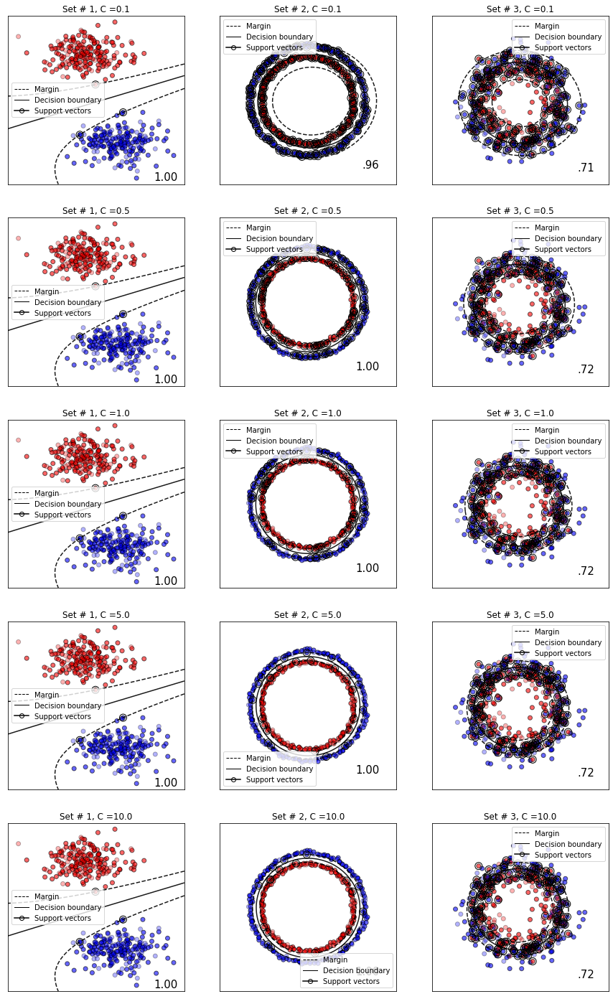

In [177]:
Cs = [0.1, 0.5, 1., 5., 10.]
f, ax = plt.subplots(len(Cs), 
                     len(datas), 
                     sharey=False, 
                     figsize=(15, 25), 
                     sharex=False)
for C_cnt, C in tqdm(enumerate(Cs)):
    for ds_cnt, ds in tqdm(enumerate(datas)):
        clf = SVC(C=C, kernel='linear')
        X, y = ds
        poly = PolynomialFeatures(2)
        X_copy = copy.deepcopy(X)
        X_train, X_test, y_train, y_test = train_test_split(X_copy, y, random_state=42)
        X_train_new = poly.fit_transform(X_train)
        X_test_new = poly.fit_transform(X_test)
        
        x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
        y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))

        cm = plt.cm.RdBu
        cm_bright = ListedColormap(['b', 'r'])
        #ax = plt.subplot(len(datas) * 5, 1, 1 + ds_cnt * len(Cs) + C_cnt)
        clf.fit(X_train_new, y_train)
        score = clf.score(X_test_new, y_test)

        xlim = ax[C_cnt][ds_cnt].get_xlim()
        ylim = ax[C_cnt][ds_cnt].get_ylim()

        x1 = np.linspace(x_min, x_max, 80)
        y1 = np.linspace(y_min, y_max, 80)
        Y1, X1 = np.meshgrid(y1, x1)
        xy = np.vstack([np.ones(len(X1.ravel())), X1.ravel(), Y1.ravel(), (X1.ravel())**2, 
                        X1.ravel() * Y1.ravel(), (Y1.ravel())**2]).T
        P = clf.decision_function(xy).reshape(X1.shape)
        ax[C_cnt][ds_cnt].contour(X1, Y1, P, colors='k',
               levels=[-1, 0, 1], alpha=0.9,
               linestyles=['--', '-', '--'])
        ax[C_cnt][ds_cnt].set_xlim(xlim)
        ax[C_cnt][ds_cnt].set_ylim(ylim)

        # Plot the training points
        ax[C_cnt][ds_cnt].scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                   edgecolors='k', alpha=0.6, label="Training points")
        # Plot the testing points
        ax[C_cnt][ds_cnt].scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.3, label="Test points")
        ax[C_cnt][ds_cnt].scatter(clf.support_vectors_[:, 1], clf.support_vectors_[:, 2],
                s=100, lw=1, facecolors='none', edgecolors='black', label="Support vectors")

        ax[C_cnt][ds_cnt].set_xlim(xx.min(), xx.max())
        ax[C_cnt][ds_cnt].set_ylim(yy.min(), yy.max())
        ax[C_cnt][ds_cnt].set_xticks(())
        ax[C_cnt][ds_cnt].set_yticks(())
        ax[C_cnt][ds_cnt].set_title(f"Set # {ds_cnt + 1}, C ={C}", fontsize=fontsize)
        ax[C_cnt][ds_cnt].text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        custom = [Line2D([0], [0], color='black', lw=1, linestyle='--'),
                  Line2D([0], [0], color='black', lw=1),
                  Line2D(range(1), range(1), color="black", marker='o', markerfacecolor="none")]
        ax[C_cnt][ds_cnt].legend(custom, ["Margin", "Decision boundary", "Support vectors"])

## Ядровой SVM

Протестируем на предыдущих двумерных выборках ядровой SVM. Попробуем следующие ядровые функции:
- линейная:  𝑘(𝑥,𝑥′)=𝑥𝑇𝑥′
- полиномиальная:  $𝑘(𝑥,𝑥′)=(𝑥𝑇𝑥′+1)^𝑑$ с различными степенями  𝑑=2,3,…
- Гауссовская-RBF:  𝑘(𝑥,𝑥′)=exp(−𝜎‖𝑥−𝑥′‖2) 

0it [00:00, ?it/s]

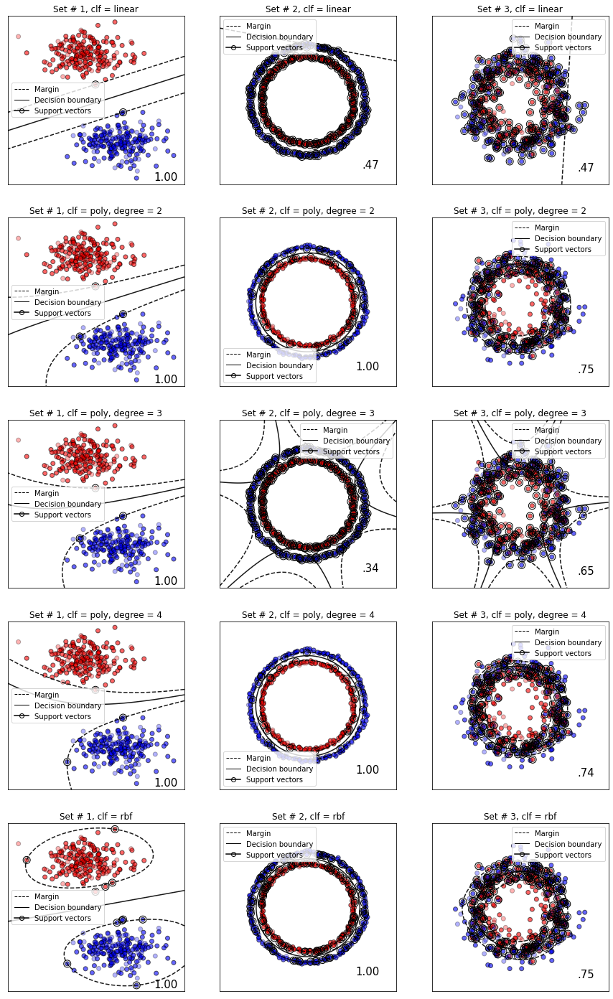

In [178]:
datas = [(X_separable, y_separable),
            (X_circles, y_circles),
            (X_random, y_random)]

clfs = [SVC(kernel='linear'), SVC(kernel='poly', degree=2), 
        SVC(kernel='poly', degree=3), SVC(kernel='poly', degree=4), 
        SVC(kernel='rbf')]

f, ax = plt.subplots(len(Cs), 
                     len(datas), 
                     sharey=False, 
                     figsize=(15, 25), 
                     sharex=False)

for clf_cnt, clf in tqdm(enumerate(clfs)):
    for ds_cnt, ds in enumerate(datas):
        h=0.001
        X, y = ds
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

        x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
        y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))

        cm = plt.cm.RdBu
        cm_bright = ListedColormap(['b', 'r'])
        #ax = plt.subplot(len(datas) * 5, 1, len(clfs) * ds_cnt + clf_cnt + 1)
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)

        xlim = ax[clf_cnt][ds_cnt].get_xlim()
        ylim = ax[clf_cnt][ds_cnt].get_ylim()

        x1 = np.linspace(X[:, 0].min() - .5, X[:, 0].max() + .5, 60)
        y1 = np.linspace(X[:, 1].min() - .5, X[:, 1].max() + .5, 60)
        Y1, X1 = np.meshgrid(y1, x1)
        xy = np.vstack([X1.ravel(), Y1.ravel()]).T
        P = clf.decision_function(xy).reshape(X1.shape)
        ax[clf_cnt][ds_cnt].contour(X1, Y1, P, colors='k',
               levels=[-1, 0, 1], alpha=0.9,
               linestyles=['--', '-', '--'])
        ax[clf_cnt][ds_cnt].set_xlim(xlim)
        ax[clf_cnt][ds_cnt].set_ylim(ylim)

        ax[clf_cnt][ds_cnt].scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                   edgecolors='k', alpha=0.6, label="Training points")
        ax[clf_cnt][ds_cnt].scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                   edgecolors='k', alpha=0.3, label="Test points")
        ax[clf_cnt][ds_cnt].scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],
                s=100, lw=1, facecolors='none', edgecolors='black', label="Support vectors")

        ax[clf_cnt][ds_cnt].set_xlim(xx.min(), xx.max())
        ax[clf_cnt][ds_cnt].set_ylim(yy.min(), yy.max())
        ax[clf_cnt][ds_cnt].set_xticks(())
        ax[clf_cnt][ds_cnt].set_yticks(())
        if clf.kernel == 'poly':
            ax[clf_cnt][ds_cnt].set_title(f"Set # {ds_cnt + 1}, clf = {clf.kernel}, degree = {clf.degree}", 
                         fontsize=fontsize)
        else:
            ax[clf_cnt][ds_cnt].set_title(f"Set # {ds_cnt + 1}, clf = {clf.kernel}", 
                         fontsize=fontsize)
        ax[clf_cnt][ds_cnt].text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        custom = [Line2D([0], [0], color='black', lw=1, linestyle='--'),
                  Line2D([0], [0], color='black', lw=1),
                  Line2D(range(1), range(1), color="black", marker='o', markerfacecolor="none")]
        ax[clf_cnt][ds_cnt].legend(custom, ["Margin", "Decision boundary", "Support vectors"])

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

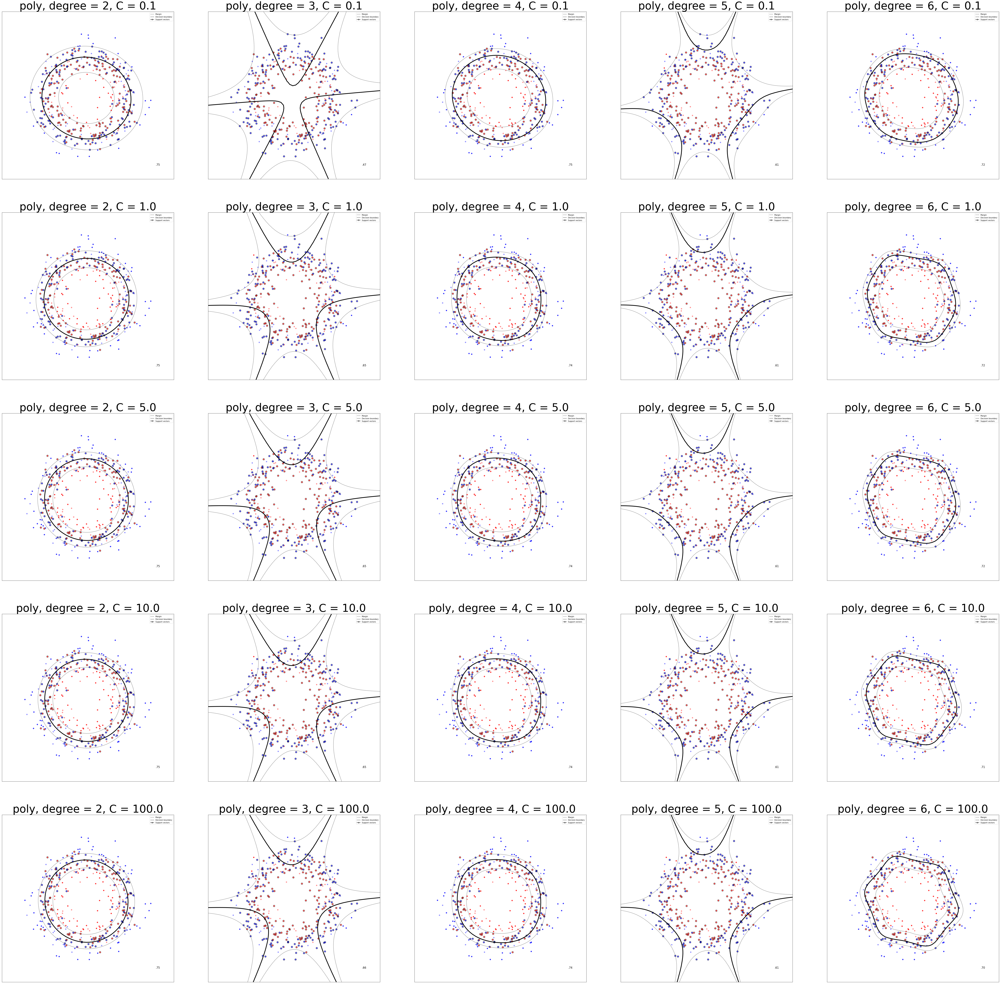

In [179]:
C_arr = [0.1, 1., 5., 10., 100.]
d_arr = [2, 3, 4, 5, 6]

ds = (X_random, y_random)
fig, axes = plt.subplots(5, 5, figsize=(100, 100))

for C_cnt, C in enumerate(C_arr):
    for degree_cnt, degree in tqdm(enumerate(d_arr)):
        clf = SVC(kernel='poly', C=C, degree=degree)
        h=0.001
        #clf = SVC(C=C, kernel='linear')
        X, y = ds
        X_train, X_test, y_train, y_test = train_test_split(X, 
                                                            y, 
                                                            test_size=.2, 
                                                            random_state=42)

        x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
        y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))

        cm = plt.cm.RdBu
        cm_bright = ListedColormap(['b', 'r'])
        ax = axes[C_cnt][degree_cnt]
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)

        xlim = ax.get_xlim()
        ylim = ax.get_ylim()

        x1 = np.linspace(X[:, 0].min() - .5, X[:, 0].max() + .5, 60)
        y1 = np.linspace(X[:, 1].min() - .5, X[:, 1].max() + .5, 60)
        Y1, X1 = np.meshgrid(y1, x1)
        xy = np.vstack([X1.ravel(), Y1.ravel()]).T
        P = clf.decision_function(xy).reshape(X1.shape)
        ax.contour(X1, Y1, P, colors='k',
               levels=[-1, 0, 1], alpha=1.,
               linestyles=['--', '-', '--'], linewidths=[1, 4, 1])
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)

        ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, alpha=0.8, label="Training points")
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.4, label="Test points")
        ax.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],
                s=100, lw=1, facecolors='none', edgecolors='black', label="Support vectors")

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        ax.set_title(str(clf.kernel) + 
                     ", degree = " + str(clf.degree) + ", C = " + str(C), fontsize=60)
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        custom = [Line2D([0], [0], color='black', lw=1, linestyle='--'),
                  Line2D([0], [0], color='black', lw=1),
                  Line2D(range(1), range(1), color="black", marker='o', markerfacecolor="none")]
        ax.legend(custom, ["Margin", "Decision boundary", "Support vectors"])

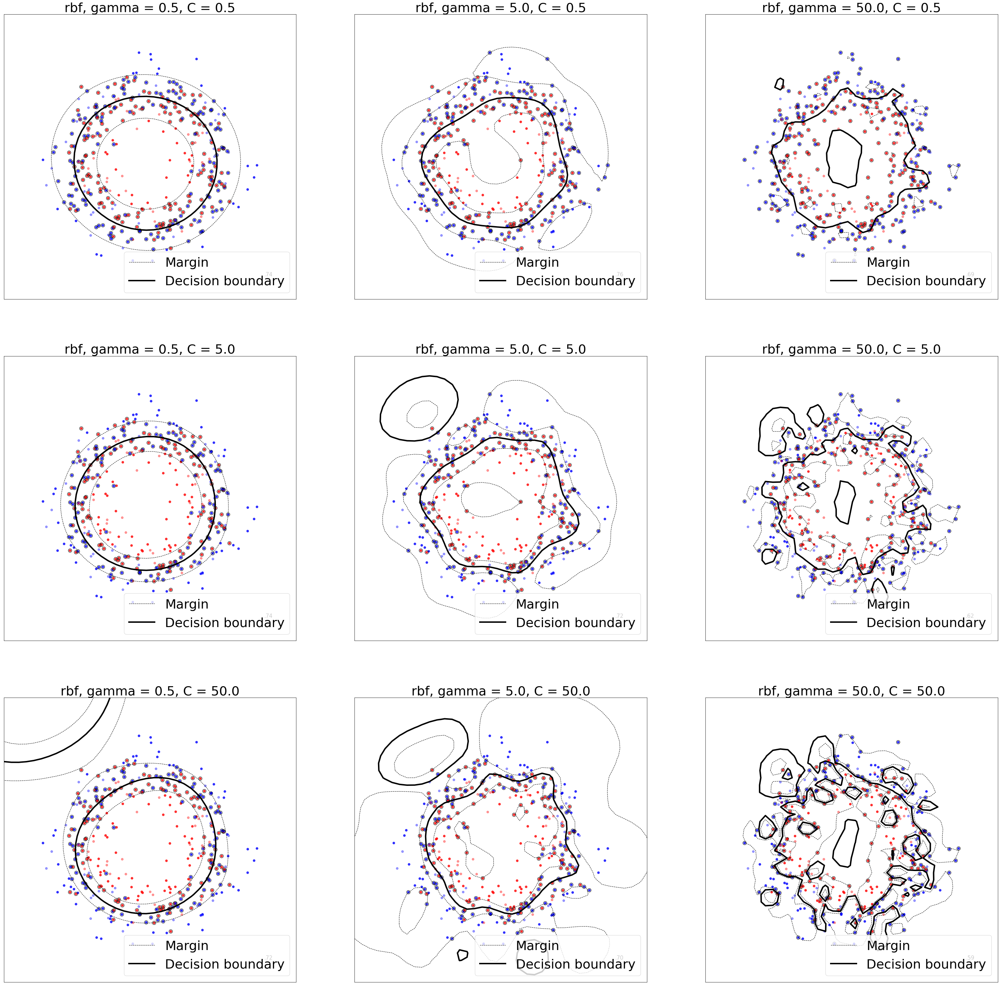

In [159]:
C_arr = [0.5, 5., 50.]
gamma_arr = [0.5, 5., 50.]

ds = (X_random, y_random)
fig, axes = plt.subplots(3, 3, figsize=(50, 50))

for C_cnt, C in enumerate(C_arr):
    for gamma_cnt, gamma in enumerate(gamma_arr):
        clf = SVC(kernel='rbf', C=C, gamma=gamma)
        h=0.001
        #clf = SVC(C=C, kernel='linear')
        X, y = ds
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=42)

        x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
        y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))

        cm = plt.cm.RdBu
        cm_bright = ListedColormap(['b', 'r'])
        ax = axes[C_cnt][gamma_cnt]
        clf.fit(X_train, y_train)
        score = clf.score(X_test, y_test)

        xlim = ax.get_xlim()
        ylim = ax.get_ylim()

        x1 = np.linspace(X[:, 0].min() - .5, X[:, 0].max() + .5, 40)
        y1 = np.linspace(X[:, 1].min() - .5, X[:, 1].max() + .5, 40)
        Y1, X1 = np.meshgrid(y1, x1)
        xy = np.vstack([X1.ravel(), Y1.ravel()]).T
        P = clf.decision_function(xy).reshape(X1.shape)
        ax.contour(X1, Y1, P, colors='k',
               levels=[-1, 0, 1], alpha=1.,
               linestyles=['--', '-', '--'], linewidths=[1, 4, 1])
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)

        ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright, alpha=0.8, label="Training points")
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.4, label="Test points")
        ax.scatter(clf.support_vectors_[:, 0], clf.support_vectors_[:, 1],
                s=100, lw=1, facecolors='none', edgecolors='black', label="Support vectors")

        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        ax.set_title(f"{clf.kernel}, gamma = {clf.gamma}, C = {C}", fontsize=fontsize * 3)
        ax.text(xx.max() - .3, yy.min() + .3, ('%.2f' % score).lstrip('0'),
                size=15, horizontalalignment='right')
        custom = [Line2D([0], [0], color='black', lw=1, linestyle='--'),
                  Line2D([0], [0], color='black', lw=4)]#,
                  #Line2D(range(1), range(1), color="black", marker='o', markerfacecolor="none")]
        ax.legend(custom, ["Margin", "Decision boundary"], fontsize=fontsize * 3)

SVM с полиномиальным ядром хорошо разделяет плохо разделимую выборку при сравнимательно больших C и не очень большой степени ядра d, большая степень d ведет к переобучению (на моей выборке всё было плохо при нечетных степенях d, но скорее всего это связано с особенностями самой выборки, напоминающей кольца), маленькое значение C ведет к недообучению.

SVM с RBF-ядром  хорошо разделяет плохо разделимую выборку при сравнимательно маленьких или средних C и маленьких $\gamma$. Слишком большое C ($\geq 50$) и сренее-большое $\gamma$ ($\geq 5$) очень быстро ведут к переобучению. Маленькое C ($< 0.5$) ведет к недообучению.

## Выводы

Логистическая регрессия хорошо решает задачу бинарной классификации и может быть быстро обучена с использованием различных градиентных алгоритмов. Линейная модель обладает точным решением и хорошо работает на линейно-разделимых выборках. SVM не требует дополнительных признаков объектов, является "метрической" моделью.

Общий недостаток - исходно эти модели призваны решать задачи линейных зависимостей, однако задача далеко не всегда имеет линейное решение, взаимосвязи между данными могут быть гораздо сложнее. Использование различных ядер, а ткже преобразование пространства признаков, увеличение размерностей может решить данную проблему. Однако, это может увеличивать расход вычислительных мощностей, а также приводить к переобучению.


Все модели требуют подбора гиперпараметров и оптимизаторов, который может быть неочевиден. Обучение логистической регрессии почти всегда требует выбора между скоростью обучения и качеством. Обучение логистической регрессии качественнее при использовании обычного градинетного спуска, а не sgd, однако sgd даёт существенное ускорение. Линейные модели могут решаться точно, но это требует больших вычислительных мощностей, а приблизительные решения могут сильно отличаться от истинных и обладают теми же проблемами, что и градиентные решения логистической регрессии. В случае SVM важен оптимальный выбор числа опорных векторов.

Предположительно, SVM лучше работает на малом количестве данных, ибо для построения зависимостей в случае линейной/логистическое регрессии важно большое количество примеров для усреднения. При большом же количестве примеров SVM может потребовать слишком больших вычислительных мощностей.